# Replicate Figure 4 of Adhikari et al. (2019)

I want to see how different the results from our code are from those of Muthukumar's paper (Adhikari et al. *Macromol.* 2019), so I will reproduce their plot of LCST behavior in a symmetric polyelectrolyte solution with salt from 300-360 K and examine the differences.

## Conversions from Muthukumar Group's Model to Wang Group's Model

Muthukumar's paper (Adhikari et al. 2019) uses some different variables than are used in the Wang group model developed by Pengfei (described in Zhang et al. *Macromol.* 2018). The conversions that we will use are described below:

1. Kuhn length $l$ from Muthkumar is approximated to be the hard-sphere diameter $\sigma$ from Wang
2. The volume fraction $\phi$ from Muthukumar is approximated to be $\frac{\pi}{6}\rho$. Thus, the salt concentrations used in Figure 4 of Adhikari et al., $\phi_{st} = \{0.02, 0.025, 0.03\}$ approximately correspond to salt densities of $\rho_{C} + \rho_{A} \approx \{0.04, 0.05, 0.06\}$.
3. Adhikari et al.'s Figure 4 uses a Bjerrum length that is $1.2l$ (see 1.) at room temperature ($T = 298$ K).  Based on the empirical formula for the dielectric constant of water used in the paper, this corresponds to $l_B = \frac{2.78075 \times 10^4}{\epsilon(T) T}$.


We are given $\phi_p$ and $\phi_s$ in each case. One can solve that

\begin{align*}
    \frac{V_1}{V_2} &= \frac{\rho_i^{II} - \rho_i^{tot}}{\rho_i^{tot} - \rho_i^{I}}\\
\end{align*}

where $i$ represents the species (polymer, solvent, salt, etc.). From this, it follows that

\begin{align*}
    \frac{\rho_i^{II} - \rho_i^{tot}}{\rho_i^{tot} - \rho_i^{I}} &= \frac{\rho_j^{II} - \rho_j^{tot}}{\rho_j^{tot} - \rho_j^{I}}\\
    \rho_i^{tot} &= \frac{\rho_i^{II}(\rho_j^{tot} - \rho_p^I) + \rho_i^{I}(\rho_j^{II}-\rho_j^{tot})}{\rho_j^{II} - \rho_j^I}\\
\end{align*}

for two different species $i$ and $j$. Since they are given, we can use $i = $ salt and $j = $ polymer.

### (N, P, T) Ensemble Comparison

To compare the model to experiments, we need to consider the (N, P, T) ensemble. To do this, we would need to calculate the total salt ions for each condition and only select those with constant values to plot. The total number of salt ions $N_s$ is given by the sum of the number of salt ions in each phase $N_s^I + N_s^{II}$,

\begin{align*}
    N_s &= N_s^I + N_s^{II}\\
    &= \rho_s^I V^I + \rho_s^{II} V^{II}\\
    &= V\left(\frac{\rho_s^I}{1+ \frac{V^{II}}{V^{I}}} + \frac{\rho_s^{II}}{1+ \frac{V^I}{V^{II}}}\right)\\
\end{align*}

We know or can calculate all of these values except for $V$ (note that $V^I/V^{II}$ requires knowledge of the total density of either the salt or polymer?????????. **Therefore, comparison of the theoretical results with experimental conditions, even qualitatively, will require calculation of the total volume of the system under each condition.**

In [1]:
import numpy as np
import glob
import pandas as pd
import matplotlib.pyplot as plt

import salt
import pe

from importlib import reload
reload(salt)
reload(pe)

    
# USER PARAMETERS
data_folder = 'salt/'
N = 100 # degree of polymerization (same for polyanion and polycation)
Z = 1 # charge per monomer (same for polyanion and polycation)
# list temperatures in range considered in Adhikari et al. (2019)
T_arr = np.linspace(300, 360, 10)
# computes range of Bjerrum lengths
lB_arr = pe.lB_fn(T_arr)
# total volume fraction of polymer
phi_p_tot = 0.1
# maximum density in given units
rho_max = 6/np.pi

print(lB_arr)

[1.20436384 1.22037559 1.23877365 1.25975651 1.28356106 1.31047005
 1.34082132 1.37501991 1.41355347 1.45701258]


Now we load all the datafiles into dataframes and store those by their Bjerrum lengths in a dictionary for later use.

In [2]:
# loads list of filepaths to computation results (different Bjerrum lengths)
filepath_list = salt.get_filepaths(data_folder)
# initializes a dictionary of Bjerrum lengths to dataframes
data = {}

# loops through data files and stores dataframes in dictionary
for filepath in filepath_list:
    # parses filepath
    _, lB = salt.get_N_lB(filepath)
    # creates dataframe out of data
    df = pd.read_csv(filepath, header=2, delim_whitespace=True)
    # calculates additional values
    salt.calc_vol_frac(df, phi_p_tot, rho_max=rho_max)
    # stores dataframe
    data[lB] = df    

# gets Bjerrum length and corresponding temperatures for the data
lB_list = list(data.keys())
T_arr = np.array([pe.lB_2_T(lB) for lB in lB_list])

# prints head to check that dataframes are formatted properly
df.head()

,BJ,rhoPCI,rhoPAI,rhoCI,rhoAI,rhoPCII,rhoPAII,rhoCII,rhoAII,rhoPI,rhoPII,rhoSI,rhoSII,rhoS,phiS
0,1.785,4.166400e-31,4.166400e-31,0.004774,0.004774,0.103319,0.103319,0.00391,0.00391,8.332800e-31,0.206639,0.009548,0.007819,0.007950,0.004163
1,1.785,4.469048e-31,4.469048e-31,0.004787,0.004787,0.103304,0.103304,0.00392,0.00392,8.938095e-31,0.206608,0.009574,0.007839,0.007971,0.004173
2,1.785,4.792940e-31,4.792940e-31,0.004800,0.004800,0.103289,0.103289,0.00393,0.00393,9.585881e-31,0.206578,0.009600,0.007859,0.007991,0.004184
3,1.785,5.139518e-31,5.139518e-31,0.004813,0.004813,0.103273,0.103273,0.00394,0.00394,1.027904e-30,0.206547,0.009626,0.007879,0.008011,0.004195
4,1.785,5.510314e-31,5.510314e-31,0.004826,0.004826,0.103258,0.103258,0.00395,0.00395,1.102063e-30,0.206516,0.009652,0.007899,0.008031,0.004205


### 3D Plot

We begin just by plotting all the data, but converting the Bjerrum length to the temperature according to the model for the dielectric constant.

In [3]:
import plotly.express as px

df_full = pd.concat([salt.tidy_df(df) for df in data.values()])
fig = px.scatter_3d(df_full, x='rhoPA', y='rhoA', z='BJ', color='phase')
fig.show()

We can see that the binodal is widening in all directions as the Bjerrum length increases. Since increasing the temperature with the current model for the dielectric constant increases the Bjerrum length, this suggests that this model predicts an LCST.

### Volume Fraction

Interpolates values based on fixed salt volume fraction and plots binodals as a function of estimated volume fraction.

KeyError: 'phiPI'

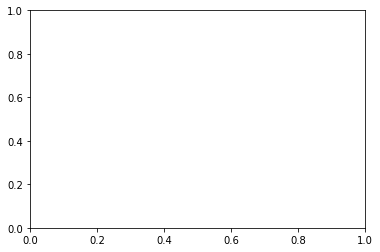

In [4]:
# list of salt volume fractions
phi_s_list = [0.02, 0.025, 0.03]

# creates plot
fig = plt.figure()
ax = fig.add_subplot(111)

# loops through salt volume fractions
for phi_s in phi_s_list:
    # plots phi_p for lB
    phi_p_I = []
    phi_p_II = []
    # loops through Bjerrum lengths of data files
    for lB in lB_list:
        df = data[lB]
        # interpolates volume fraction of polymer
        I, II = salt.interp_s(phi_s, df, 'phi', chris=False)
        phi_p_I += [I]
        phi_p_II += [II]
        
    # adds trend lines to plot
    ax.plot(np.array(phi_p_I), T_arr, marker='o', label=r'$\phi_s =$' + ' {0:.3f} (I)'.format(phi_s))
    ax.plot(np.array(phi_p_II), T_arr, marker='o', label=r'$\phi_s =$' + ' {0:.3f} (II)'.format(phi_s))
    
# formats plot
ax.set_xlabel(r'$\phi_p$', fontsize=18)
ax.set_ylabel(r'$T$ [K]', fontsize=18)
ax.set_title('N = {0:d}, Z = {1:d}'.format(N, Z))
plt.legend(loc='best', fontsize=12)

### Density

Interpolates values based on fixed salt density and plots binodals as a function of density.

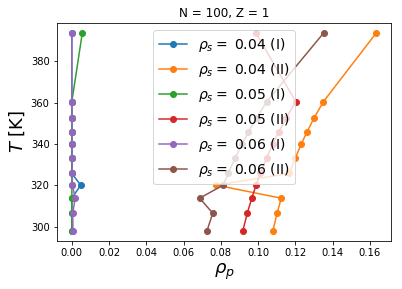

In [5]:
reload(pe)
reload(salt)

# list of salt densities (non-dim by sigma^3)
rho_s_list = [0.02*6/np.pi, 0.025*6/np.pi, 0.03*6/np.pi]

# creates plot
fig = plt.figure()
ax = fig.add_subplot(111)

# loops through salt volume fractions
for rho_s in rho_s_list:
    # plots phi_p for lB
    rho_p_I = []
    rho_p_II = []
    for lB in lB_list:
        df = data[lB]
        I, II = salt.interp_s(rho_s, df, 'rho')
        rho_p_I += [I]
        rho_p_II += [II]
        
    # adds trend lines to plot
    ax.plot(np.array(rho_p_I), T_arr, marker='o', label=r'$\rho_s =$' + ' {0:.2f} (I)'.format(rho_s))
    ax.plot(np.array(rho_p_II), T_arr, marker='o', label=r'$\rho_s =$' + ' {0:.2f} (II)'.format(rho_s))
    
# formats plots
ax.set_xlabel(r'$\rho_p$', fontsize=18)
ax.set_ylabel(r'$T$ [K]', fontsize=18)
ax.set_title('N = {0:d}, Z = {1:d}'.format(N, Z))
plt.legend(loc='best', fontsize=14)

The figure we are comparing this to from the paper is shown below:

<div>
    <img src="figures/adhikari_muthukumar_2019_macromol_fig4.jpeg" alt="Drawing" style="width: 400px;"/>
</div>

"Figure 4. Temperature ($T$) vs polyelectrolyte concentration ($\phi_p$) coexistence curves for different salt concentrations ($\phi_{st}$) and a fixed polyelectrolyte concentration ($\phi_{pt}$) (marked by the dashed line) of starting solutions. The set of parameters used includes $a = 0.02$, $b = 0.0013$, $p/l = 1$, and $l_B/l = 1.2$ at room temperature ($T = 298$ K) and $N = 100$."

The results both show LCST behavior but have many qualitative distinctions, including very different dilute-phase concentrations and opposite concavity of the concentrated phase binodal. Adhikari et al. considered the increase in polyelectrolyte concentration in the dilute to be an important feature of the experiments to capture with the theory, but this feature is not seen in our results.